# FP Data Mining Kelompok 11
Anggota 


1.   M. Akmal Joedhiwan     05111940000125
2.   Abiya Sabitta Ragadani 05111940000166
3.   Cliffton Delias P      05111940000181



# Import Library

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read data
Dataset : https://www.kaggle.com/datasets/venky73/spam-mails-dataset

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
df=pd.read_csv('/content/gdrive/MyDrive/spam_ham_dataset.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5171 entries, 0 to 5170
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  5171 non-null   int64 
 1   label       5171 non-null   object
 2   text        5171 non-null   object
 3   label_num   5171 non-null   int64 
dtypes: int64(2), object(2)
memory usage: 161.7+ KB


# Null dataset check

In [ ]:
df.isna().sum()

Unnamed: 0    0
label         0
text          0
label_num     0
dtype: int64

# Duplicate Check


In [ ]:
df.duplicated(subset=None, keep='first')

0       False
1       False
2       False
3       False
4       False
        ...  
5166    False
5167    False
5168    False
5169    False
5170    False
Length: 5171, dtype: bool

In [ ]:
df.drop_duplicates()

,Unnamed: 0,label,text,label_num
0,605,ham,Subject: enron methanol ; meter # : 988291\r\n...,0
1,2349,ham,"Subject: hpl nom for january 9 , 2001\r\n( see...",0
2,3624,ham,"Subject: neon retreat\r\nho ho ho , we ' re ar...",0
3,4685,spam,"Subject: photoshop , windows , office . cheap ...",1
4,2030,ham,Subject: re : indian springs\r\nthis deal is t...,0
...,...,...,...,...
5166,1518,ham,Subject: put the 10 on the ft\r\nthe transport...,0
5167,404,ham,Subject: 3 / 4 / 2000 and following noms\r\nhp...,0
5168,2933,ham,Subject: calpine daily gas nomination\r\n>\r\n...,0
5169,1409,ham,Subject: industrial worksheets for august 2000...,0


# View data from label
Melihat jumlah pembagian spam dan ham

In [ ]:
df['label'].value_counts()

ham     3672
spam    1499
Name: label, dtype: int64

Visualization from label

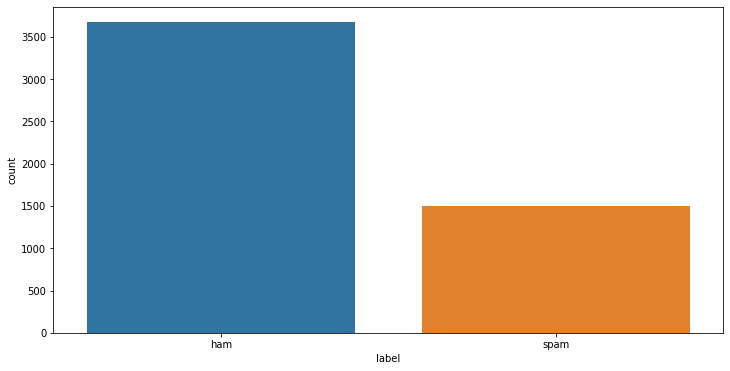

In [ ]:
plt.figure(figsize = (12, 6))
sns.countplot(data = df, x = 'label');

# Training split
Untuk membantu membagi saat n-gram

In [ ]:
y=df['label'].values
y.shape

(5171,)

In [ ]:
x=df['text'].values
x.shape

(5171,)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
(x_train, x_val, y_train, y_test)=train_test_split(x,y,test_size=0.3,random_state=7)

# Remove Punctuation
Menghilangkan tanda baca pada teks agar lebih mudah di analisis

In [ ]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
def remove_punctuation(text):
  if(type(text)==float):
    return text
  ans=""  
  for i in text:     
    if i not in string.punctuation:
      ans+=i    
  return ans

In [ ]:
df1=pd.DataFrame(x_train)
df1=df1.rename(columns={0:'text'})

In [ ]:
df2=pd.DataFrame(y_train)
df2=df2.rename(columns={0:'label'})
df_train=pd.concat([df1,df2],axis=1)

In [ ]:
df3=pd.DataFrame(x_val)
df3=df3.rename(columns={0:'text'})

In [ ]:
df4=pd.DataFrame(y_test)
df4=df2.rename(columns={0:'label'})
df_test=pd.concat([df3,df4],axis=1)

In [ ]:
df_train.head()

,text,label
0,Subject: re : missing service rates for ena / ...,ham
1,Subject: txu fuels / sds nomination for may 20...,ham
2,"Subject: re : eex bid\r\ndaren ,\r\nit is my u...",ham
3,Subject: # 6487 rangel / dewpoint\r\nplease se...,ham
4,Subject: basf - freeport natural gas nominatio...,ham


In [ ]:
df_test.head()

,text,label
0,"Subject: digital cameras , pda ' s and mp 3 pl...",ham
1,Subject: tinsley field\r\n- - - - - - - - - - ...,ham
2,Subject: get a free sony dvd handycam\r\n,ham
3,Subject: claim your winnings ! ! !\r\ncashout ...,ham
4,"Subject: well heads\r\ndaren , shore line woul...",ham


In [ ]:
df_train['text']= df_train['text'].apply(lambda x:remove_punctuation(x))
df_test['text']= df_test['text'].apply(lambda x:remove_punctuation(x))

In [ ]:
df_train.head()

,text,label
0,Subject re missing service rates for ena hpl...,ham
1,Subject txu fuels sds nomination for may 2001...,ham
2,Subject re eex bid\r\ndaren \r\nit is my unde...,ham
3,Subject 6487 rangel dewpoint\r\nplease see t...,ham
4,Subject basf freeport natural gas nominations...,ham


# N gram
Analisis N-Gram


In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Unigram
Analisis 1-gram dengan melihat kata apa yang sering muncul

In [ ]:
def generate_N_grams(text,ngram=1):
  words=[word for word in text.split(" ") if word not in set(stopwords.words('english'))]  
  print("Sentence after removing stopwords:",words)
  temp=zip(*[words[i:] for i in range(0,ngram)])
  ans=[' '.join(ngram) for ngram in temp]
  return ans

In [ ]:
generate_N_grams("The sun rises in the east",2)

Sentence after removing stopwords: ['The', 'sun', 'rises', 'east']


['The sun', 'sun rises', 'rises east']

In [ ]:
from collections import defaultdict

In [ ]:
positiveValues=defaultdict(int)
negativeValues=defaultdict(int)
neutralValues=defaultdict(int)

In [ ]:
for text in df_train[df_train.label=="spam"].text:
  for word in generate_N_grams(text):
    positiveValues[word]+=1 

Sentence after removing stopwords: ['Subject', 'fast', 'shipping\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\nfast', 'ups', 'shipping', 'low', '', 'price', 'drugs', 'canada\r\ntake', '6\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\n']
Sentence after removing stopwords: ['Subject', 'l', '', 'times', 'personals', '', '', 'need', 'someone', 'hold\r\ngoodbye\r\nclock', 'ameslanchronic', 'bp', 'brendageographer\r\nmatroid', 'rundownphonograph', 'deregulate', 'byronicconnivance\r\nset', 'adroitpratt', 'coppery', 'gushforbade\r\nabovementioned', 'latchtitmouse', 'drum', 'squidbentley\r\nupsurge', 'australisfredericks']
Sentence after removing stopwords: ['Subject', 'switzerland\r\nhi\r\nswiss', 'pharm', '', 'ring', 'bell', 'mind', '\r\ncurious', '', '', 'read', '', '\r\nin', 'heart', 'switzerland', 'since', '1931', '', 'online', 'store\r\ncarries', 'wide', 'assortment', 'medicines', '\r\nwith', 'laxed', 'laws', 'ask', 'questions', 'leave', 'discr

In [ ]:
for text in df_train[df_train.label=="ham"].text:
  for word in generate_N_grams(text):
    negativeValues[word]+=1

Sentence after removing stopwords: ['Subject', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\n', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', 'forwarded', 'ami', 'chokshi', '', 'corp', '', 'enron', '01', '', '04', '', '2000\r\n10', '', '36', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '\r\nrhonda', 'robinson', '', 'ect\r\n01', '', '04', '', '2000', '10', '', '23', 'am\r\nto', '', 'stacey', 'neuweiler', '', 'hou', '', 'ect', '', 'ect', '', 'ami', 'chokshi', '', 'corp', '', 'enron', '', 'enron\r\ncc', '', 'gregory', 'steagall', '', 'hou', '', 'ect', '', 'ect\r\nsubject', '', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\nlisted', 'expense', 'contracts', 'need', 'rates', 'input', 'sitara', '', 'please\r\nlet', 'know', 'soon', 'possible', 'responsible', 'input', 'these\r\nrates', '\r\nthanks', '\r\n', '', '', '', '', '', '', '', '', '', '', '', 

In [ ]:
df_positive=pd.DataFrame(sorted(positiveValues.items(),key=lambda x:x[1],reverse=True))
df_negative=pd.DataFrame(sorted(negativeValues.items(),key=lambda x:x[1],reverse=True))

In [ ]:
pd1=df_positive[0][:10]
pd2=df_positive[1][:10]

In [ ]:
ned1=df_negative[0][:10]
ned2=df_negative[1][:10]

Dilihat kata yang sering muncul pada spam menggunakan unigram adalah Subject, 3, karakter yang tidak diketahui, 2, http, 0, com, 1, company

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


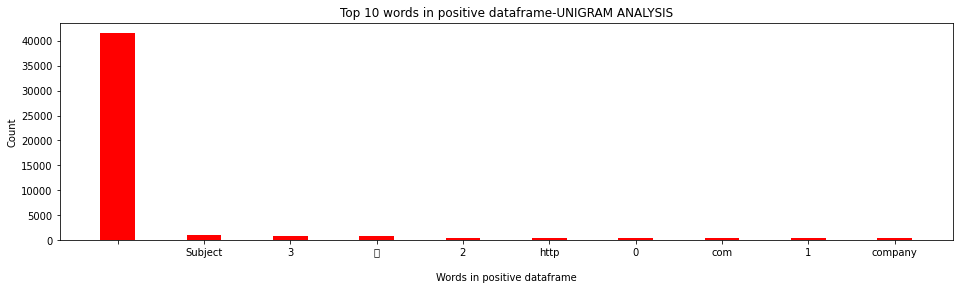

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(pd1,pd2, color ='red',
        width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-UNIGRAM ANALYSIS")
plt.savefig("positive-unigram.png")
plt.show()

Sedangkan untuk Ham dengan unigram, kata yang sering muncul adalah ect, hou, enron, subject, karakter yang tidak dikenali, 2000, gas, com, deal

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


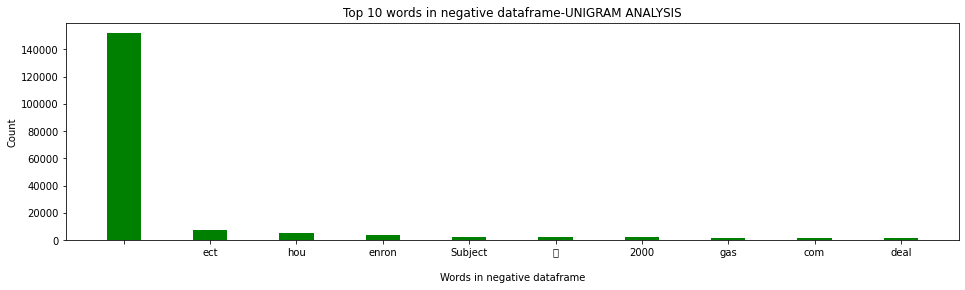

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(ned1,ned2, color ='green',
        width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-UNIGRAM ANALYSIS")
plt.savefig("negative-unigram.png")
plt.show()

In [ ]:
df_positive.head()

,0,1
0,,41531
1,Subject,1060
2,3,881
3,\r\n,747
4,2,529


In [ ]:
df_negative.head()

,0,1
0,,151887
1,ect,7846
2,hou,4919
3,enron,3813
4,Subject,2559


## Bigram
Analisis teks menggunakan 2-gram atau Bigram

In [ ]:
positiveValues2=defaultdict(int)
negativeValues2=defaultdict(int)

In [ ]:
for text in df_train[df_train.label=="spam"].text:
  for word in generate_N_grams(text,2):
    positiveValues2[word]+=1

Sentence after removing stopwords: ['Subject', 'fast', 'shipping\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\nfast', 'ups', 'shipping', 'low', '', 'price', 'drugs', 'canada\r\ntake', '6\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\n']
Sentence after removing stopwords: ['Subject', 'l', '', 'times', 'personals', '', '', 'need', 'someone', 'hold\r\ngoodbye\r\nclock', 'ameslanchronic', 'bp', 'brendageographer\r\nmatroid', 'rundownphonograph', 'deregulate', 'byronicconnivance\r\nset', 'adroitpratt', 'coppery', 'gushforbade\r\nabovementioned', 'latchtitmouse', 'drum', 'squidbentley\r\nupsurge', 'australisfredericks']
Sentence after removing stopwords: ['Subject', 'switzerland\r\nhi\r\nswiss', 'pharm', '', 'ring', 'bell', 'mind', '\r\ncurious', '', '', 'read', '', '\r\nin', 'heart', 'switzerland', 'since', '1931', '', 'online', 'store\r\ncarries', 'wide', 'assortment', 'medicines', '\r\nwith', 'laxed', 'laws', 'ask', 'questions', 'leave', 'discr

In [ ]:
for text in df_train[df_train.label=="ham"].text:
  for word in generate_N_grams(text,2):
    negativeValues2[word]+=1

Sentence after removing stopwords: ['Subject', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\n', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', 'forwarded', 'ami', 'chokshi', '', 'corp', '', 'enron', '01', '', '04', '', '2000\r\n10', '', '36', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '\r\nrhonda', 'robinson', '', 'ect\r\n01', '', '04', '', '2000', '10', '', '23', 'am\r\nto', '', 'stacey', 'neuweiler', '', 'hou', '', 'ect', '', 'ect', '', 'ami', 'chokshi', '', 'corp', '', 'enron', '', 'enron\r\ncc', '', 'gregory', 'steagall', '', 'hou', '', 'ect', '', 'ect\r\nsubject', '', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\nlisted', 'expense', 'contracts', 'need', 'rates', 'input', 'sitara', '', 'please\r\nlet', 'know', 'soon', 'possible', 'responsible', 'input', 'these\r\nrates', '\r\nthanks', '\r\n', '', '', '', '', '', '', '', '', '', '', '', 

In [ ]:
df_positive2=pd.DataFrame(sorted(positiveValues2.items(),key=lambda x:x[1],reverse=True))
df_negative2=pd.DataFrame(sorted(negativeValues2.items(),key=lambda x:x[1],reverse=True))

In [ ]:
pd1bi=df_positive2[0][:10]
pd2bi=df_positive2[1][:10]

In [ ]:
ned1bi=df_negative2[0][:10]
ned2bi=df_negative2[1][:10]

Dapat dilihat jika menggunakan bigram kata yang sering muncul sebagai berikut untuk spam

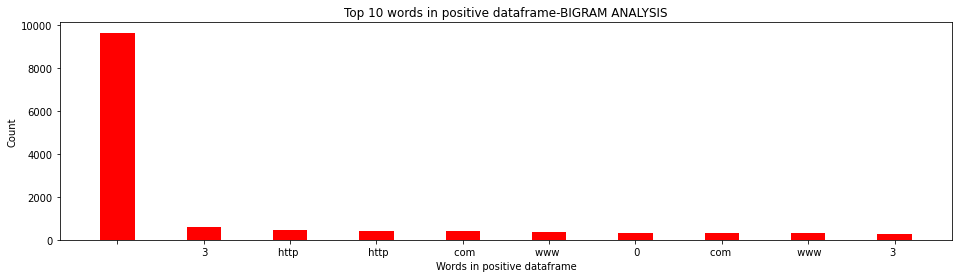

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(pd1bi,pd2bi, color ='red',width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-BIGRAM ANALYSIS")
plt.savefig("positive-bigram.png")
plt.show()

Dapat dilihat jika menggunakan bigram kata yang sering muncul sebagai berikut untuk ham

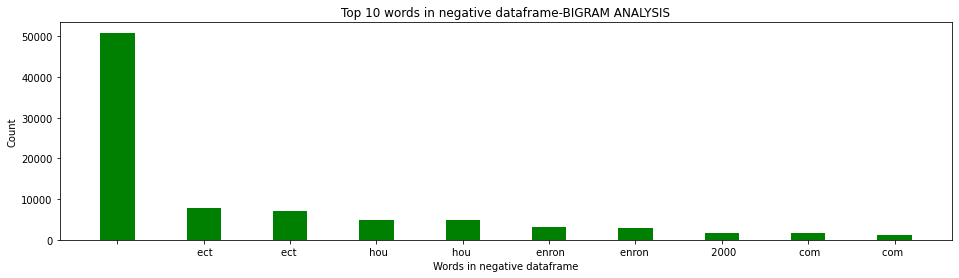

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(ned1bi,ned2bi, color ='green',
        width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-BIGRAM ANALYSIS")
plt.savefig("negative-bigram.png")
plt.show()

In [ ]:
df_positive2.head()

,0,1
0,,9659
1,3,601
2,http,470
3,http,415
4,com,412


In [ ]:
df_negative2.head()

,0,1
0,,50895
1,ect,7829
2,ect,7004
3,hou,4918
4,hou,4918


## Trigram
Analisis teks menggunakan 3-gram atau Trigram

In [ ]:
positiveValues3=defaultdict(int)
negativeValues3=defaultdict(int)

In [ ]:
for text in df_train[df_train.label=="spam"].text:
  for word in generate_N_grams(text,3):
    positiveValues3[word]+=1

Sentence after removing stopwords: ['Subject', 'fast', 'shipping\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\nfast', 'ups', 'shipping', 'low', '', 'price', 'drugs', 'canada\r\ntake', '6\r\n', 'rnd', '', 'alt', '', 'rnd', '', 'alt', '', 'rnd', '', 'alt\r\n']
Sentence after removing stopwords: ['Subject', 'l', '', 'times', 'personals', '', '', 'need', 'someone', 'hold\r\ngoodbye\r\nclock', 'ameslanchronic', 'bp', 'brendageographer\r\nmatroid', 'rundownphonograph', 'deregulate', 'byronicconnivance\r\nset', 'adroitpratt', 'coppery', 'gushforbade\r\nabovementioned', 'latchtitmouse', 'drum', 'squidbentley\r\nupsurge', 'australisfredericks']
Sentence after removing stopwords: ['Subject', 'switzerland\r\nhi\r\nswiss', 'pharm', '', 'ring', 'bell', 'mind', '\r\ncurious', '', '', 'read', '', '\r\nin', 'heart', 'switzerland', 'since', '1931', '', 'online', 'store\r\ncarries', 'wide', 'assortment', 'medicines', '\r\nwith', 'laxed', 'laws', 'ask', 'questions', 'leave', 'discr

In [ ]:
for text in df_train[df_train.label=="ham"].text:
  for word in generate_N_grams(text,3):
    negativeValues3[word]+=1

Sentence after removing stopwords: ['Subject', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\n', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', 'forwarded', 'ami', 'chokshi', '', 'corp', '', 'enron', '01', '', '04', '', '2000\r\n10', '', '36', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '\r\nrhonda', 'robinson', '', 'ect\r\n01', '', '04', '', '2000', '10', '', '23', 'am\r\nto', '', 'stacey', 'neuweiler', '', 'hou', '', 'ect', '', 'ect', '', 'ami', 'chokshi', '', 'corp', '', 'enron', '', 'enron\r\ncc', '', 'gregory', 'steagall', '', 'hou', '', 'ect', '', 'ect\r\nsubject', '', '', 'missing', 'service', 'rates', 'ena', '', 'hplc', 'cash', 'desk\r\nlisted', 'expense', 'contracts', 'need', 'rates', 'input', 'sitara', '', 'please\r\nlet', 'know', 'soon', 'possible', 'responsible', 'input', 'these\r\nrates', '\r\nthanks', '\r\n', '', '', '', '', '', '', '', '', '', '', '', 

In [ ]:
df_positive3=pd.DataFrame(sorted(positiveValues3.items(),key=lambda x:x[1],reverse=True))
df_negative3=pd.DataFrame(sorted(negativeValues3.items(),key=lambda x:x[1],reverse=True))

In [ ]:
pd1tri=df_positive3[0][:10]
pd2tri=df_positive3[1][:10]

In [ ]:
ned1tri=df_negative3[0][:10]
ned2tri=df_negative3[1][:10]

Dapat dilihat jika menggunakan trigram kata yang sering muncul sebagai berikut untuk spam

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


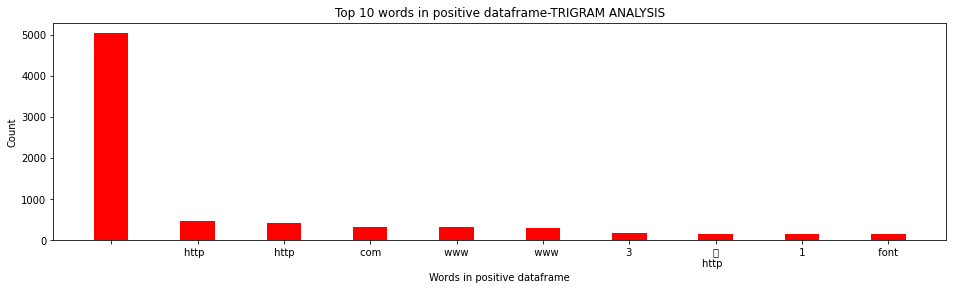

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(pd1tri,pd2tri, color ='red',
        width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-TRIGRAM ANALYSIS")
plt.savefig("positive-trigram.png")
plt.show()

Dapat dilihat jika menggunakan trigram kata yang sering muncul sebagai berikut untuk ham

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


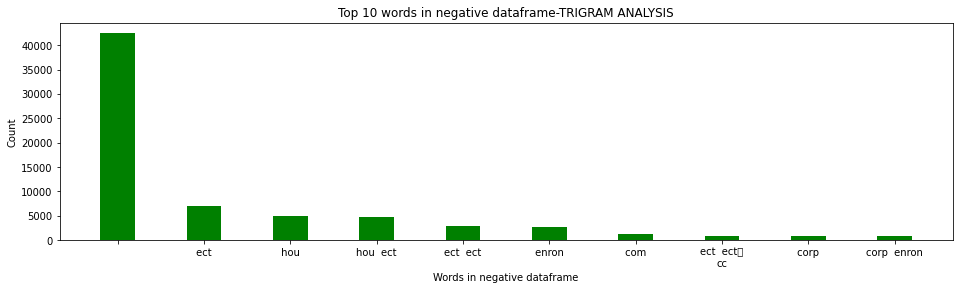

In [ ]:
plt.figure(1,figsize=(16,4))
plt.bar(ned1tri,ned2tri, color ='green',
        width = 0.4) 
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-TRIGRAM ANALYSIS")
plt.savefig("negative-trigram.png")
plt.show()

In [ ]:
df_negative3.head()

,0,1
0,,42495
1,ect,6997
2,hou,4918
3,hou ect,4854
4,ect ect,2862


In [ ]:
df_positive3.head()

,0,1
0,,5038
1,http,463
2,http,415
3,com,332
4,www,326


# Visualization WordCloud
Analisis Teks menggunakan WordCloud

In [ ]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

In [ ]:
stopwords = STOPWORDS
stopwords = list(stopwords)
STOPWORDS = nltk.corpus.stopwords.words('english')
stopwords = stopwords + STOPWORDS

In [ ]:
ham_words = ' '
spam_words = ' '

In [ ]:
def gen_wordcloud(wordcloud):
    plt.figure(figsize = (10,8))
    plt.imshow(wordcloud)
    plt.tight_layout(pad=0)
    plt.axis('off')
    plt.show()

In [ ]:
for words in df_train[df_train.label=="spam"].text:
    txt = words.lower()
    tokens = nltk.word_tokenize(txt)
    for word in tokens:
        spam_words = spam_words + word + " "

Berikut kata yang sering muncul dalam teks spam

				 SPAM WORDS


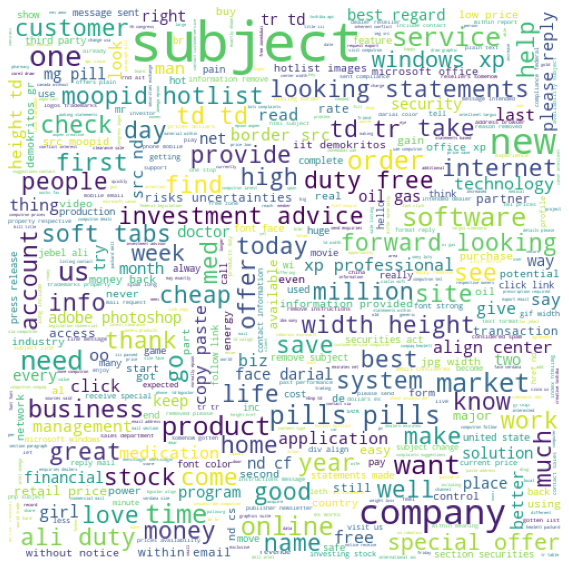

In [ ]:
print("\t\t\t\t SPAM WORDS")    
wordcloud = WordCloud(background_color = 'white', width = 500, height = 500, stopwords = stopwords,
                     max_words = 500, max_font_size = 50, random_state = 42).generate(spam_words)
gen_wordcloud(wordcloud)

In [ ]:
for words in df_train[df_train.label=="ham"].text:
    txt = words.lower()
    tokens = nltk.word_tokenize(txt)
    for word in tokens:
        ham_words = ham_words + word + " "

Berikut kata yang sering muncul untuk ham

				 HAM WORDS


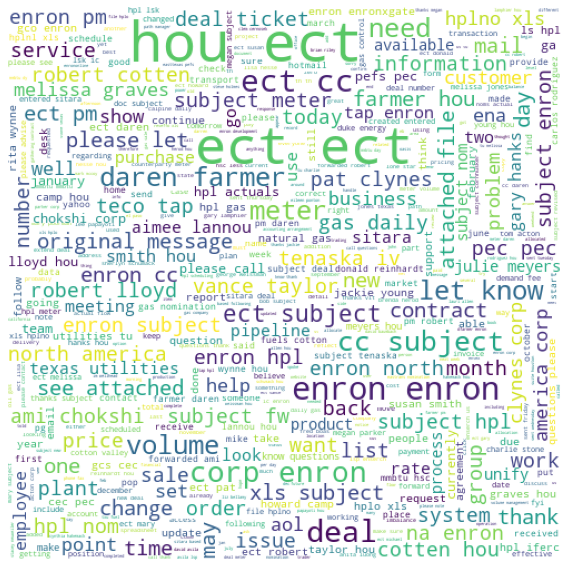

In [ ]:
print("\t\t\t\t HAM WORDS")    
wordcloud = WordCloud(background_color = 'white', width = 500, height = 500, stopwords = stopwords,
                     max_words = 500, max_font_size = 50, random_state = 42).generate(ham_words)
gen_wordcloud(wordcloud)

In [ ]:
!pip install scikit-plot
import scikitplot as skplt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Ham Spam Percentage

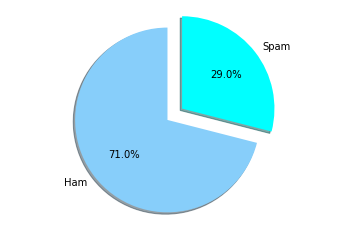

In [ ]:
count_Class = pd.value_counts(df.label, sort = True)

# Data to Plot
labels = 'Ham', 'Spam'
sizes = [count_Class[0], count_Class[1]]
colors = ['lightskyblue', 'aqua']
explode = (0.1, 0.1)

# Plot
plt.pie(sizes, explode = explode, labels = labels, colors = colors,
        autopct = '%1.1f%%', shadow = True, startangle = 90)
plt.axis('equal')
plt.show()

# Train-Test
Melakukan Training dan testing dengan 3 skenario, menggunakan naive bayes, random forest, dan hyperparameter random forest.

In [ ]:
import nltk
nltk.download('stopwords')

import re
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
ps=PorterStemmer()
lemmatizer=WordNetLemmatizer()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
nltk.download('wordnet')
nltk.download('omw-1.4')
corpus=[]
for i in range(0,len(df)):
    review=re.sub('[^a-zA-Z]',' ',df['text'][i])
    review=review.lower()
    review=review.split()
    review=[lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
    review=' '.join(review)
    corpus.append(review)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
corpus

['subject enron methanol meter follow note gave monday preliminary flow data provided daren please override pop daily volume presently zero reflect daily activity obtain gas control change needed asap economics purpose',
 'subject hpl nom january see attached file hplnol xl hplnol xl',
 'subject neon retreat ho ho ho around wonderful time year neon leader retreat time know time year extremely hectic tough think anything past holiday life go past week december january like think minute calender handed beginning fall semester retreat scheduled weekend january youth minister conference brad dustin connected week going change date following weekend january come part need think think agree important u get together time recharge battery get far spring semester lot trouble difficult u get away without kid etc brad came potential alternative get together weekend let know prefer first option would retreat similar done past several year year could go heartland country inn www com outside brenham

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(max_features=2500)
x=cv.fit_transform(corpus).toarray()

In [ ]:
y=pd.get_dummies(df['label'])

In [ ]:
y=y.iloc[:,1].values

## Train-Test Split
Split train and test
train : 80%
test : 20%

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=7)

## Naive Bayes MultinomialNB

In [ ]:
from sklearn.naive_bayes import MultinomialNB

In [ ]:
model = MultinomialNB().fit(x_train,y_train)

In [ ]:
ypred=model.predict(x_test)

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
accuracy_score(ypred,y_test)*100

94.58937198067633

In [ ]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(ypred,y_test))

[[693  11]
 [ 45 286]]


Hasil dari naive bayes : 

Akurasi : 94.5894

False Positive : 11

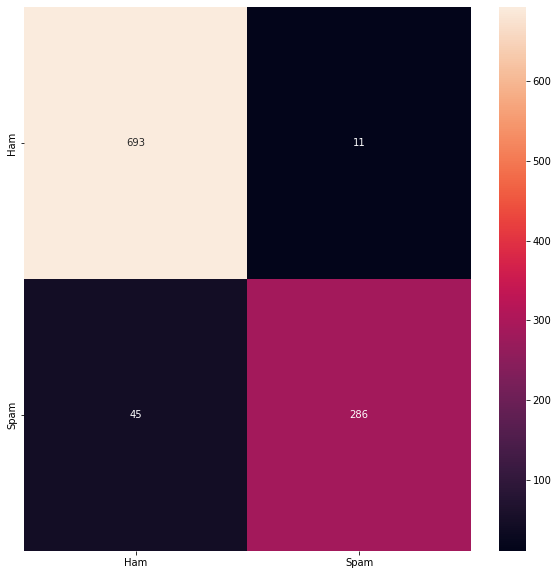

In [ ]:
plt.figure(figsize = (10, 10))
sns.heatmap(confusion_matrix(ypred,y_test),annot = True, fmt="n", xticklabels=['Ham', 'Spam'], yticklabels=['Ham', 'Spam'])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       738
           1       0.86      0.96      0.91       297

    accuracy                           0.95      1035
   macro avg       0.92      0.95      0.94      1035
weighted avg       0.95      0.95      0.95      1035



## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
cl=RandomForestClassifier()
cl.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred2 = cl.predict(x_test)

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score
cm2 = confusion_matrix(y_test, y_pred2)
print('Accuracy: ', accuracy_score(y_test, y_pred2) * 100)

Accuracy:  97.29468599033815


Hasil dari Random Forest : 

Akurasi : 97.2947

False Positive : 9

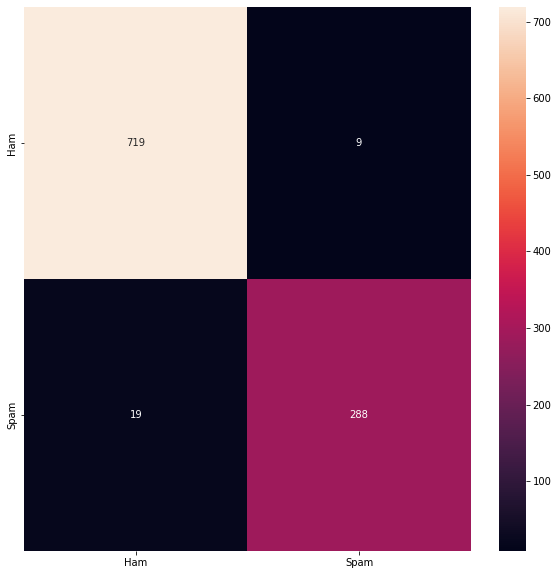

In [ ]:
plt.figure(figsize = (10, 10))
sns.heatmap(confusion_matrix(y_pred2,y_test),annot = True, fmt="n", xticklabels=['Ham', 'Spam'], yticklabels=['Ham', 'Spam'])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       738
           1       0.94      0.97      0.95       297

    accuracy                           0.97      1035
   macro avg       0.96      0.97      0.97      1035
weighted avg       0.97      0.97      0.97      1035



## Hyperparameter Random Forest

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
estimator = [100, 200]
criterion = ['gini', 'entropy']
max_features = ['auto', 'sqrt', 'log2']
class_weight = ['balanced', 'balanced_subsample', 'None']
test_param = {'n_estimators':estimator, 'criterion':criterion, 
              'max_features':max_features, 'class_weight':class_weight}
clf = GridSearchCV(RandomForestClassifier(), test_param)
clf.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py", line 367, in fit
    y, expanded_class_weight = self._validate_y_class_weight(y)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py", line 762, in _validate_y_class_weight
    % self.class_weight
ValueError: Valid pr

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'class_weight': ['balanced', 'balanced_subsample',
                                          'None'],
                         'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200]})

In [ ]:
clf.best_params_

{'class_weight': 'balanced_subsample',
 'criterion': 'entropy',
 'max_features': 'log2',
 'n_estimators': 200}

In [ ]:
grid_pred = clf.predict(x_test)

Hasil dari Random Forest 

Akurasi : 97.2947

False Positive : 8

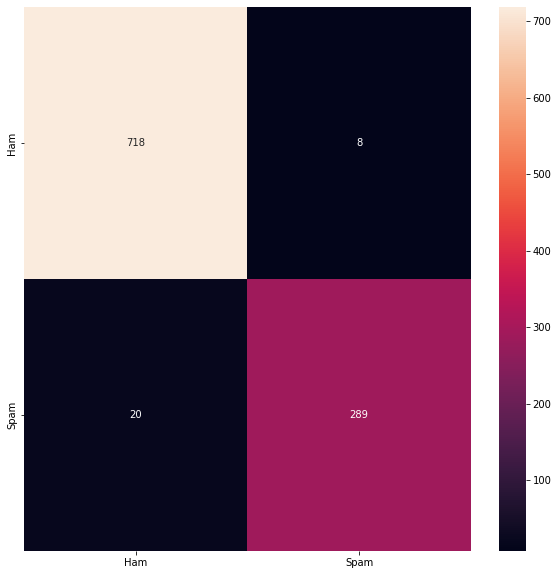

In [ ]:
plt.figure(figsize = (10, 10))
sns.heatmap(confusion_matrix(grid_pred,y_test),annot = True, fmt="n", xticklabels=['Ham', 'Spam'], yticklabels=['Ham', 'Spam'])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, grid_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       738
           1       0.94      0.97      0.95       297

    accuracy                           0.97      1035
   macro avg       0.96      0.97      0.97      1035
weighted avg       0.97      0.97      0.97      1035



In [109]:
accuracy_score(grid_pred,y_test)*100

97.29468599033815